In [ ]:
import numpy as np
import pandas as pd
from keras import backend as K
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Lambda, Add, Reshape
from keras.models import Model
from keras.models import load_model
from keras.callbacks import ModelCheckpoint,EarlyStopping
from sklearn.model_selection import train_test_split
import pickle
from tqdm import tqdm as tqdm
import os, sys
import urllib.request
import datetime
import tensorflow as tf
import time
import re
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.patches as patches
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [ ]:
#########################################
# 1. Set parameter
#########################################
n_epoch=30 # Number of epoch
pat=50 # Patience
filenm='cnn1' # File name of this model 

In [ ]:
#########################################
# 2. Download files used in this code
#########################################
# [NOTICE] In this code, we use 2000 snapshots (1 pickle file) with float16 precision to make the file size small altough we use 10000 snapshots (5} pickle files) with float64 precision in the original paper.
# You need about 600MB free space in total for the downloading files.
# The pickle file is loaded in "3. Load flow field."

def dl_progress(count, block_size, total_size):
    sys.stdout.write('\r %d%% of %d MB' %(100*count*block_size/total_size, total_size/1024/1024))

savename = "flow_field_data0.pickle"
if(not os.path.exists(savename)):
    url = "https://dl.dropboxusercontent.com/s/3pnuoxrx9xvqxi2/flow_field_data0.pickle"
    print('Downloading:',savename)
    urllib.request.urlretrieve(url, savename, dl_progress)
    print('')

savename = "mode0.csv"
if(not os.path.exists(savename)):
    url = "https://dl.dropboxusercontent.com/s/x3bw3h1zfwty84x/mode0.csv"
    print('Downloading:',savename)
    urllib.request.urlretrieve(url, savename, dl_progress)
    print('')


In [4]:
#########################################
# 3. Load flow field
#########################################
# Flow fields are stored in "pickle" files
X=[]
for i in tqdm(range(1)):
    fnstr="flow_field_data" + '{0:01d}'.format(i)+".pickle"
    # fnstr="/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/flow_field_data" + '{0:01d}'.format(i)+".pickle"
    
    # Pickle load
    with open(fnstr, 'rb') as f:
        obj = pickle.load(f)
    if i==0:
        X=obj
    else:
        X=np.concatenate([X,obj],axis=0)
print(X.shape)
print(type(X))
# The size of X is (# of snapshots, 384(Nx), 192(Ny), 2(u&v))




100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

(2000, 384, 192, 2)
<class 'numpy.ndarray'>


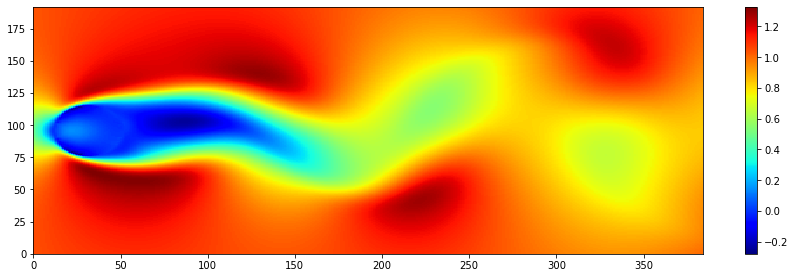

In [5]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(X[1][:,:,0].T, cmap = cm.jet)
plt.colorbar()

In [ ]:
# Load average field
mode0=pd.read_csv("mode0.csv", header=None, delim_whitespace=None)
# mode0=pd.read_csv("/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/mode0.csv", header=None, delim_whitespace=None)

mode0=mode0.values

x_num0=384; y_num0=192; # [74X800] -> [91,74,800,2]
Uf0=mode0[0:x_num0*y_num0]
Vf0=mode0[x_num0*y_num0:x_num0*y_num0*2]
Uf0=np.reshape(Uf0,[x_num0,y_num0])
Vf0=np.reshape(Vf0,[x_num0,y_num0])

# We consider fluctuation component of flow field
for i in range(len(X)):
    X[i,:,:,0]=X[i,:,:,0]-Uf0
    X[i,:,:,1]=X[i,:,:,1]-Vf0

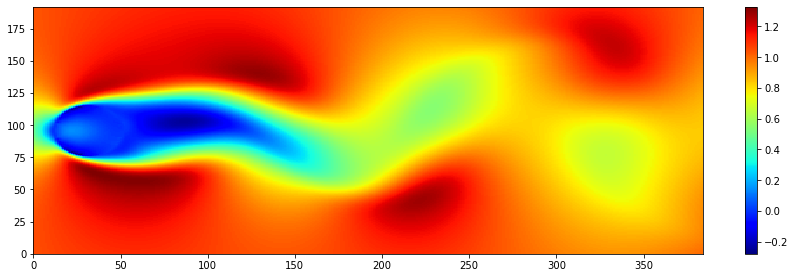

In [7]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(X[1][:,:,0].T, cmap = cm.jet)
plt.colorbar()

In [18]:
# np.savetxt("X.csv", X[0,:,:,0])

In [19]:
print(mode0)
print(mode0.shape)
print(X.shape)
print(X[0:7,:,:,:].shape)

[[ 1.04569856]
 [ 1.04564594]
 [ 1.04558038]
 ...
 [-0.00378744]
 [-0.00370586]
 [-0.00363141]]
(147456, 1)
(2000, 384, 192, 2)
(7, 384, 192, 2)


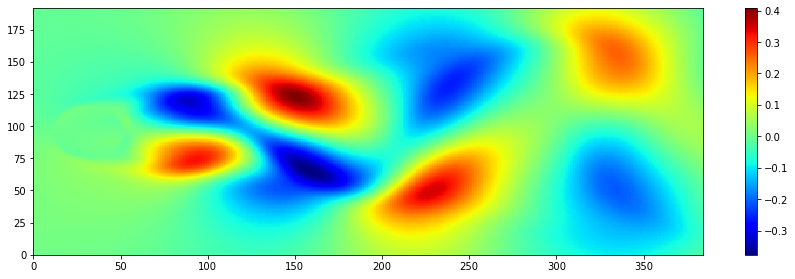

In [20]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(X[1][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# CNN-AE with 2 decoders

In [24]:
#########################################
# 4. Make machine learning model
#########################################
input_img = Input(shape=(384, 192, 2))
## Encoder
x = Conv2D(16, (3, 3), activation='tanh', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Reshape([6*3*4])(x) 
encoded = Dense(2,activation='tanh')(x)
## Two variables
val1= Lambda(lambda x: x[:,0:1])(encoded)
val2= Lambda(lambda x: x[:,1:2])(encoded)
## Decoder 1
x1 = Dense(6*3*4,activation='tanh')(val1)
x1 = Reshape([6,3,4])(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(4,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(16,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1d = Conv2D(2,(3,3),activation='linear',padding='same', name='x1d_2')(x1)
## Decoder 2
x2 = Dense(6*3*4,activation='tanh')(val2)
x2 = Reshape([6,3,4])(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(4,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(16,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2d = Conv2D(2,(3,3),activation='linear',padding='same', name='x2d_2')(x2)

decoded = Add()([x1d,x2d])

autoencoder = Model(input_img, decoded)

# Custom Loss function 
def customLoss(y_true, y_pred):
    loss = K.mean(K.square(y_pred - y_true) * K.square(y_pred - y_true), axis=-1)
    return loss

# autoencoder.compile(optimizer='adam', loss='mse')
autoencoder.compile(optimizer='adam', loss=customLoss)

# Check the network structure
autoencoder.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d_58 (Conv2D)              (None, 384, 192, 16) 304         input_4[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_18 (MaxPooling2D) (None, 192, 96, 16)  0           conv2d_58[0][0]                  
__________________________________________________________________________________________________
conv2d_59 (Conv2D)              (None, 192, 96, 8)   1160        max_pooling2d_18[0][0]           
____________________________________________________________________________________________

In [25]:
#########################################
# 5. Train the network
#########################################
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.hdf5'
tempfn=filenm+'.hdf5'
model_cb=ModelCheckpoint(tempfn, monitor='val_loss',save_best_only=True,verbose=1)
early_cb=EarlyStopping(monitor='val_loss', patience=pat,verbose=1)
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
cb = [model_cb, early_cb]

X_train,X_test,y_train,y_test=train_test_split(X,X,test_size=0.3,random_state=1)
print(X.shape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2000, 384, 192, 2)
(1400, 384, 192, 2)
(1400, 384, 192, 2)
(600, 384, 192, 2)
(600, 384, 192, 2)


In [26]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

history=autoencoder.fit(X_train, y_train,
                epochs=n_epoch,
                batch_size=8,
                shuffle=True,
                validation_data=(X_test, y_test),
                callbacks=[cb,tensorboard_callback])
df_results = pd.DataFrame(history.history)
df_results['epoch'] = history.epoch
tempfn=filenm+'.csv'
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.csv'
df_results.to_csv(path_or_buf=tempfn,index=False)


/home/mark/anaconda3/envs/gpu/lib/python3.6/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/30
175/175 [==============================] - 5s 23ms/step - loss: 0.0011 - val_loss: 1.4464e-04

Epoch 00001: val_loss improved from inf to 0.00014, saving model to cnn1.hdf5
Epoch 2/30
175/175 [==============================] - 3s 15ms/step - loss: 9.0733e-05 - val_loss: 6.0848e-05

Epoch 00002: val_loss improved from 0.00014 to 0.00006, saving model to cnn1.hdf5
Epoch 3/30
175/175 [==============================] - 3s 16ms/step - loss: 5.0111e-05 - val_loss: 4.2262e-05

Epoch 00003: val_loss improved from 0.00006 to 0.00004, saving model to cnn1.hdf5
Epoch 4/30
175/175 [==============================] - 3s 16ms/step - loss: 3.8039e-05 - val_loss: 3.4463e-05

Epoch 00004: val_loss improved from 0.00004 to 0.00003, saving model to cnn1.hdf5
Epoch 5/30
175/175 [==============================] - 3s 15ms/step - loss: 3.2433e-05 - val_loss: 3.0606e-05

Epoch 00005: val_loss improved from 0.00003 to 0.00003, saving model to cnn1.hdf5
Epoch 6/30
175/175 [============================

In [11]:
autoencoder = load_model('cnn1.hdf5')
autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 384, 192, 16) 304         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 192, 96, 16)  0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 192, 96, 8)   1160        max_pooling2d[0][0]              
______________________________________________________________________________________________

In [12]:
# Iterate over model layers
for layer in autoencoder.layers:
    print(layer.name, layer)

input_1 <keras.engine.input_layer.InputLayer object at 0x7f92d00f7b00>
conv2d <keras.layers.convolutional.Conv2D object at 0x7f931e44dba8>
max_pooling2d <keras.layers.pooling.MaxPooling2D object at 0x7f92602d5358>
conv2d_1 <keras.layers.convolutional.Conv2D object at 0x7f92602d55c0>
max_pooling2d_1 <keras.layers.pooling.MaxPooling2D object at 0x7f92602d5b38>
conv2d_2 <keras.layers.convolutional.Conv2D object at 0x7f92d00f7cc0>
max_pooling2d_2 <keras.layers.pooling.MaxPooling2D object at 0x7f92602d9358>
conv2d_3 <keras.layers.convolutional.Conv2D object at 0x7f92d00f7ac8>
max_pooling2d_3 <keras.layers.pooling.MaxPooling2D object at 0x7f92d00f7b70>
conv2d_4 <keras.layers.convolutional.Conv2D object at 0x7f92602d9d68>
max_pooling2d_4 <keras.layers.pooling.MaxPooling2D object at 0x7f92602da320>
conv2d_5 <keras.layers.convolutional.Conv2D object at 0x7f92602da5c0>
max_pooling2d_5 <keras.layers.pooling.MaxPooling2D object at 0x7f92602dab38>
reshape <keras.layers.core.Reshape object at 0x7f92

In [13]:
# Get output from a specific layer
inter_output_model = Model(autoencoder.input, autoencoder.get_layer('add').output)
r = inter_output_model.predict(X_train)
print(r.shape)
print(r[0][:,:,0].shape)

(1400, 384, 192, 2)
(384, 192)


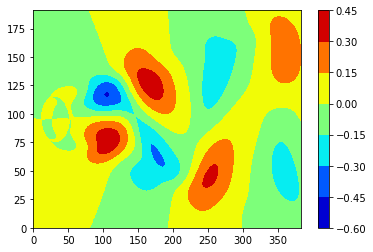

In [14]:
# Plot contour with traditional method
x = np.arange(384)
y = np.arange(192)
X, Y = np.meshgrid(x, y)
plt.contourf(X, Y, X_train[0][:,:,0].T, cmap='jet')
plt.colorbar()
plt.show()


# Comparison of reference snapshot and latent output (2 decoders)

(1400, 384, 192, 2)
(1400, 384, 192, 2)


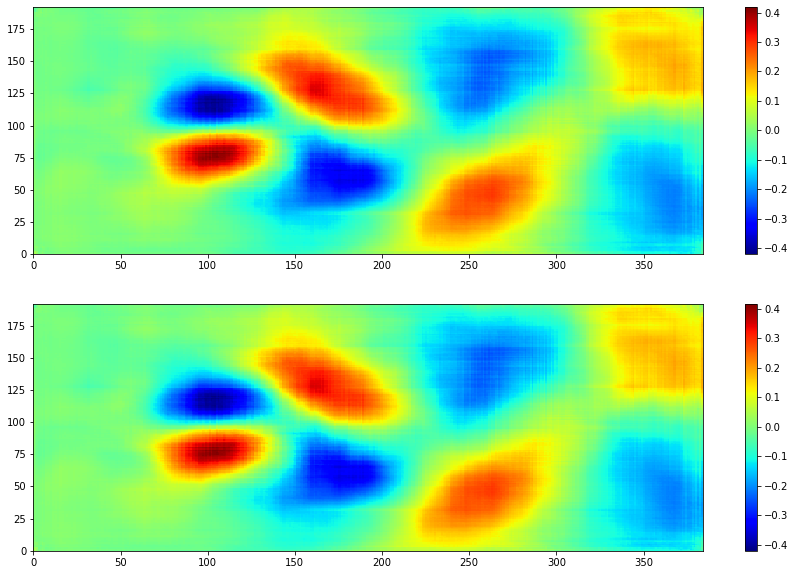

In [17]:
# visulaize x1d_2, x2d_2
# Get output from a specific layer x1d_2
x1d_2 = Model(autoencoder.input, autoencoder.get_layer('x1d_2').output)
x1d_2_tmp = x1d_2.predict(X_train)
print(x1d_2_tmp.shape)

x2d_2 = Model(autoencoder.input, autoencoder.get_layer('x2d_2').output)
x2d_2_tmp = x2d_2.predict(X_train)
print(x2d_2_tmp.shape)

plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(x1d_2_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(212)
plt.pcolormesh(x2d_2_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()


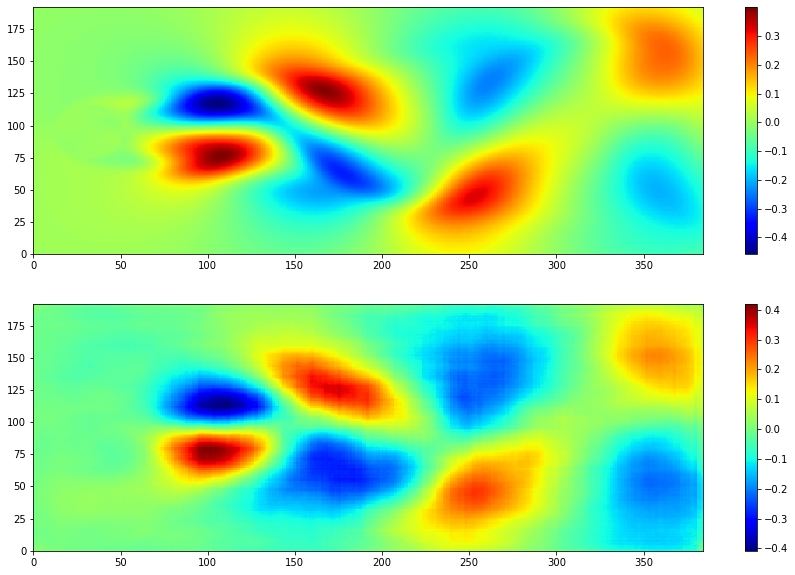

In [11]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(X_train[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# PLot the first latent output snapshot of U vector
plt.subplot(212)
plt.pcolormesh(r[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

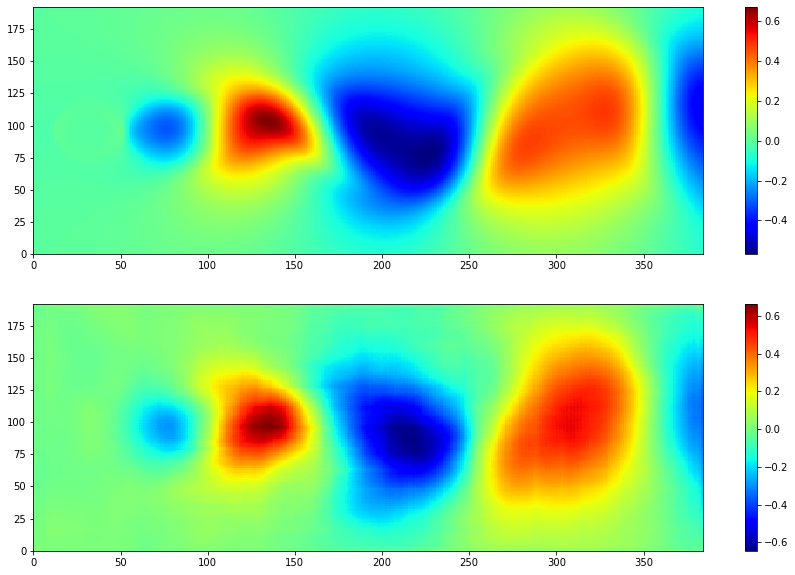

In [12]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.pcolormesh(X_train[0][:,:,1].T, cmap = cm.jet)
plt.colorbar()

# PLot the first latent output snapshot of U vector
plt.subplot(212)
plt.pcolormesh(r[0][:,:,1].T, cmap = cm.jet)
plt.colorbar()

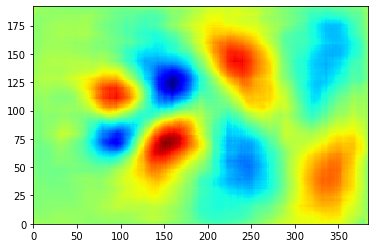

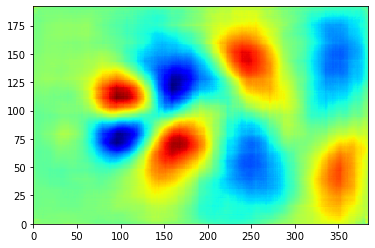

In [30]:
from IPython.display import clear_output
for i in range(10):
    clear_output(wait=True)
    plt.pause(0.5)
    plt.pcolormesh(r[i][:,:,0].T, cmap = cm.jet)
    # plt.savefig("timestep_" + '{0:01d}'.format(i) + ".png")


# CNN-AE with 3 decoders

In [5]:
#########################################
# 3. Load flow field
#########################################
# Flow fields are stored in "pickle" files
X=[]
for i in tqdm(range(1)):
    fnstr="flow_field_data" + '{0:01d}'.format(i)+".pickle"
    # fnstr="/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/flow_field_data" + '{0:01d}'.format(i)+".pickle"
    
    # Pickle load
    with open(fnstr, 'rb') as f:
        obj = pickle.load(f)
    if i==0:
        X=obj
    else:
        X=np.concatenate([X,obj],axis=0)
print(X.shape)
# The size of X is (# of snapshots, 384(Nx), 192(Ny), 2(u&v))

# Load average field
mode0=pd.read_csv("mode0.csv", header=None, delim_whitespace=None)
# mode0=pd.read_csv("/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/mode0.csv", header=None, delim_whitespace=None)

mode0=mode0.values

x_num0=384; y_num0=192; # [74X800] -> [91,74,800,2]
Uf0=mode0[0:x_num0*y_num0]
Vf0=mode0[x_num0*y_num0:x_num0*y_num0*2]
Uf0=np.reshape(Uf0,[x_num0,y_num0])
Vf0=np.reshape(Vf0,[x_num0,y_num0])

# We consider fluctuation component of flow field
for i in range(len(X)):
    X[i,:,:,0]=X[i,:,:,0]-Uf0
    X[i,:,:,1]=X[i,:,:,1]-Vf0


100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


(2000, 384, 192, 2)


In [7]:

#########################################
# 4. Make machine learning model
#########################################
input_img = Input(shape=(384, 192, 2))
## Encoder
x = Conv2D(16, (3, 3), activation='tanh', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Reshape([6*3*4])(x)
encoded = Dense(3,activation='tanh')(x)
## Two variables
val1= Lambda(lambda x: x[:,0:1])(encoded)
val2= Lambda(lambda x: x[:,1:2])(encoded)
val3= Lambda(lambda x: x[:,2:3])(encoded)
## Decoder 1
x1 = Dense(6*3*4,activation='tanh')(val1)
x1 = Reshape([6,3,4])(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(4,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(16,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1d = Conv2D(2,(3,3),activation='linear',padding='same', name='x1d_3')(x1)
## Decoder 2
x2 = Dense(6*3*4,activation='tanh')(val2)
x2 = Reshape([6,3,4])(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(4,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(16,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2d = Conv2D(2,(3,3),activation='linear',padding='same', name='x2d_3')(x2)
## Decoder 3
x3 = Dense(6*3*4,activation='tanh')(val3)
x3 = Reshape([6,3,4])(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(4,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(16,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3d = Conv2D(2,(3,3),activation='linear',padding='same', name='x3d_3')(x3)

# decoded = Add()([x1d,x2d])
# decoded = Add()([x1d,x2d,x3d])
decoded = Add()([x1d, x3d])

autoencoder1 = Model(input_img, decoded)
autoencoder1.compile(optimizer='adam', loss='mse')

# Check the network structure
autoencoder1.summary()



Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 384, 192, 16) 304         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 192, 96, 16)  0           conv2d_21[0][0]                  
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 192, 96, 8)   1160        max_pooling2d_6[0][0]            
______________________________________________________________________________________________

In [8]:
#########################################
# 5. Train the network
#########################################
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.hdf5'
filenm = 'cnn2'
tempfn=filenm+'.hdf5'
model_cb=ModelCheckpoint(tempfn, monitor='val_loss',save_best_only=True,verbose=1)
early_cb=EarlyStopping(monitor='val_loss', patience=pat,verbose=1)
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
cb = [model_cb, early_cb]

X_train,X_test,y_train,y_test=train_test_split(X,X,test_size=0.3,random_state=1)
print(X.shape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(2000, 384, 192, 2)
(1400, 384, 192, 2)
(1400, 384, 192, 2)
(600, 384, 192, 2)
(600, 384, 192, 2)


In [9]:

tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

history=autoencoder1.fit(X_train, y_train,
                epochs=n_epoch,
                batch_size=8,
                shuffle=True,
                validation_data=(X_test, y_test),
                callbacks=[cb,tensorboard_callback])
df_results = pd.DataFrame(history.history)
df_results['epoch'] = history.epoch
tempfn=filenm+'.csv'
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.csv'
df_results.to_csv(path_or_buf=tempfn,index=False)

/home/mark/anaconda3/envs/gpu/lib/python3.6/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/30
175/175 [==============================] - 7s 23ms/step - loss: 0.0105 - val_loss: 0.0038

Epoch 00001: val_loss improved from inf to 0.00380, saving model to cnn2.hdf5
Epoch 2/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0031 - val_loss: 0.0027

Epoch 00002: val_loss improved from 0.00380 to 0.00271, saving model to cnn2.hdf5
Epoch 3/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0025 - val_loss: 0.0024

Epoch 00003: val_loss improved from 0.00271 to 0.00237, saving model to cnn2.hdf5
Epoch 4/30
175/175 [==============================] - 3s 16ms/step - loss: 0.0023 - val_loss: 0.0022

Epoch 00004: val_loss improved from 0.00237 to 0.00221, saving model to cnn2.hdf5
Epoch 5/30
175/175 [==============================] - 3s 16ms/step - loss: 0.0022 - val_loss: 0.0021

Epoch 00005: val_loss improved from 0.00221 to 0.00214, saving model to cnn2.hdf5
Epoch 6/30
175/175 [==============================] - 3s 16ms/step - loss: 0.0021 - 

In [10]:
autoencoder1 = load_model('cnn2.hdf5')
autoencoder1.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 384, 192, 16) 304         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 192, 96, 16)  0           conv2d_21[0][0]                  
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 192, 96, 8)   1160        max_pooling2d_6[0][0]            
______________________________________________________________________________________________

# Comparison of reference snapshot and latent output (3 decoders)

In [9]:
# visulaize x1d_3, x2d_3,x3d_3
# Get output from a specific layer x1d_2
x1d_3 = Model(autoencoder1.input, autoencoder1.get_layer('x1d_3').output)
x1d_3_tmp = x1d_3.predict(X_train)
print(x1d_3_tmp.shape)

x2d_3 = Model(autoencoder1.input, autoencoder1.get_layer('x2d_3').output)
x2d_3_tmp = x2d_3.predict(X_train)
print(x2d_3_tmp.shape)

x3d_3 = Model(autoencoder1.input, autoencoder1.get_layer('x3d_3').output)
x3d_3_tmp = x3d_3.predict(X_train)
print(x3d_3_tmp.shape)



(1400, 384, 192, 2)
(1400, 384, 192, 2)
(1400, 384, 192, 2)


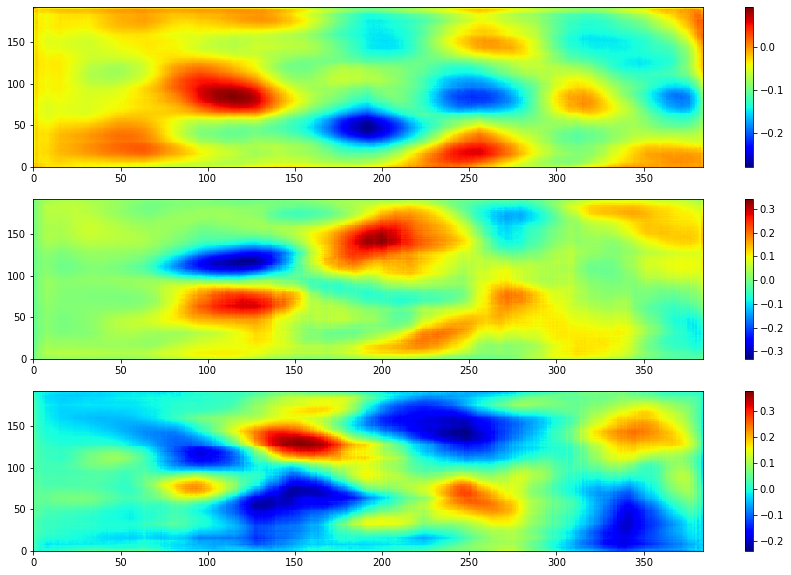

In [10]:

plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(311)
plt.pcolormesh(x1d_3_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(312)
plt.pcolormesh(x2d_3_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(313)
plt.pcolormesh(x3d_3_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

In [16]:
# Get output from a specific layer
inter_output_model = Model(autoencoder1.input, autoencoder1.get_layer('add').output)
r1 = inter_output_model.predict(X_train)
print(r1.shape)
print(r1[0][:,:,0].shape)

(1400, 384, 192, 2)
(384, 192)


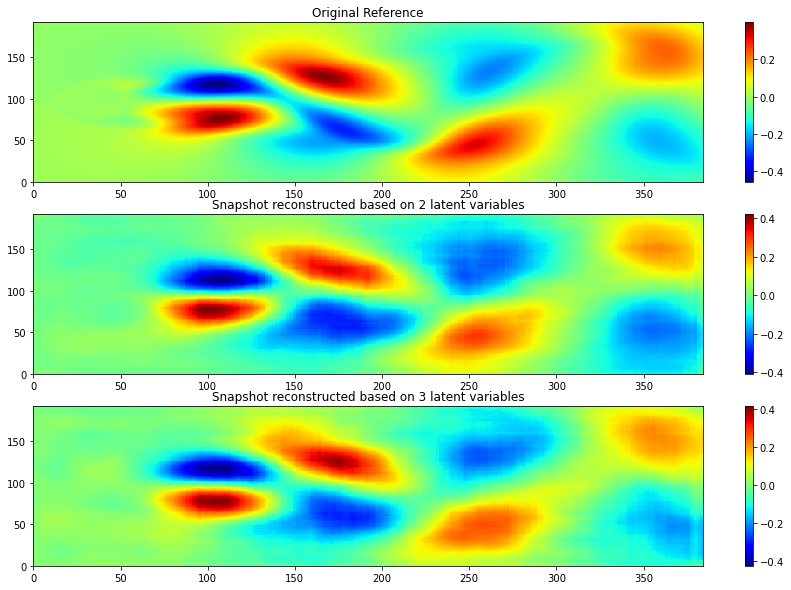

In [22]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(311)
plt.title("Original Reference")
plt.pcolormesh(X_train[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# PLot the first latent output snapshot of U vector
plt.subplot(312)
plt.title("Snapshot reconstructed based on 2 latent variables")
plt.pcolormesh(r[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# PLot the first latent output snapshot of U vector
plt.subplot(313)
plt.title("Snapshot reconstructed based on 3 latent variables")
plt.pcolormesh(r1[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

In [ ]:
%load_ext tensorboard
%tensorboard --logdira "$logdir"

In [11]:
# Get output from a specific layer
inter_output_model = Model(autoencoder1.input, autoencoder1.get_layer('add_1').output)
r13 = inter_output_model.predict(X_train)
print(r13.shape)
print(r13[0][:,:,0].shape)

(1400, 384, 192, 2)
(384, 192)


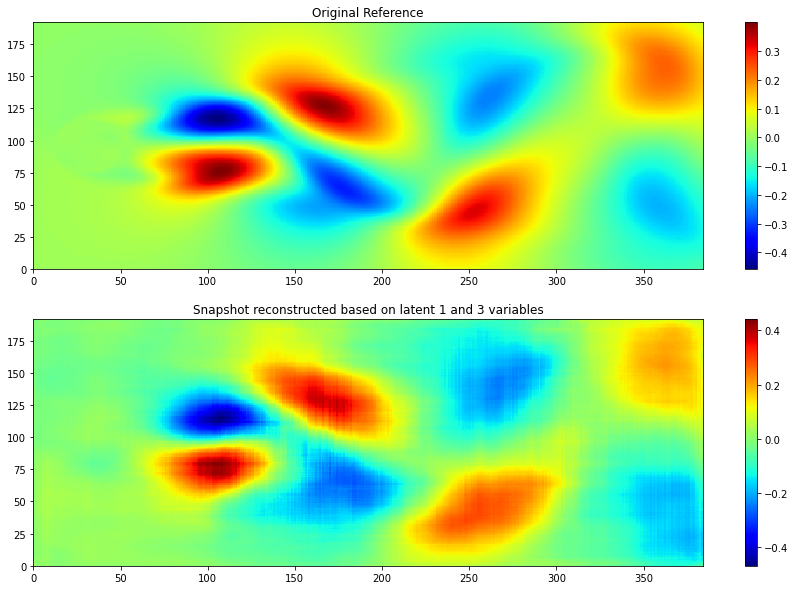

In [13]:
plt.figure(1, figsize=(15, 10))

# Plot the first training snapshot of U vector
plt.subplot(211)
plt.title("Original Reference")
plt.pcolormesh(X_train[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# PLot the first latent output snapshot of U vector
plt.subplot(212)
plt.title("Snapshot reconstructed based on latent 1 and 3 variables")
plt.pcolormesh(r13[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# CNN-AE with 4 latents

In [3]:
#########################################
# 3. Load flow field
#########################################
# Flow fields are stored in "pickle" files
X=[]
for i in tqdm(range(1)):
    fnstr="flow_field_data" + '{0:01d}'.format(i)+".pickle"
    # fnstr="/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/flow_field_data" + '{0:01d}'.format(i)+".pickle"
    
    # Pickle load
    with open(fnstr, 'rb') as f:
        obj = pickle.load(f)
    if i==0:
        X=obj
    else:
        X=np.concatenate([X,obj],axis=0)
print(X.shape)
# The size of X is (# of snapshots, 384(Nx), 192(Ny), 2(u&v))

# Load average field
mode0=pd.read_csv("mode0.csv", header=None, delim_whitespace=None)
# mode0=pd.read_csv("/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/mode0.csv", header=None, delim_whitespace=None)

mode0=mode0.values

x_num0=384; y_num0=192; # [74X800] -> [91,74,800,2]
Uf0=mode0[0:x_num0*y_num0]
Vf0=mode0[x_num0*y_num0:x_num0*y_num0*2]
Uf0=np.reshape(Uf0,[x_num0,y_num0])
Vf0=np.reshape(Vf0,[x_num0,y_num0])

# We consider fluctuation component of flow field
for i in range(len(X)):
    X[i,:,:,0]=X[i,:,:,0]-Uf0
    X[i,:,:,1]=X[i,:,:,1]-Vf0

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


(2000, 384, 192, 2)


In [12]:

#########################################
# 4. Make machine learning model
#########################################
input_img = Input(shape=(384, 192, 2))
## Encoder
x = Conv2D(16, (3, 3), activation='tanh', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(4, (3, 3), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Reshape([6*3*4])(x)
encoded = Dense(4,activation='tanh')(x)
## Two variables
val1= Lambda(lambda x: x[:,0:1])(encoded)
val2= Lambda(lambda x: x[:,1:2])(encoded)
val3= Lambda(lambda x: x[:,2:3])(encoded)
val4= Lambda(lambda x: x[:,3:4])(encoded)
## Decoder 1
x1 = Dense(6*3*4,activation='tanh')(val1)
x1 = Reshape([6,3,4])(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(4,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(8,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1 = Conv2D(16,(3,3),activation='tanh',padding='same')(x1)
x1 = UpSampling2D((2,2))(x1)
x1d = Conv2D(2,(3,3),activation='linear',padding='same', name='x1d_4')(x1)
## Decoder 2
x2 = Dense(6*3*4,activation='tanh')(val2)
x2 = Reshape([6,3,4])(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(4,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(8,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2 = Conv2D(16,(3,3),activation='tanh',padding='same')(x2)
x2 = UpSampling2D((2,2))(x2)
x2d = Conv2D(2,(3,3),activation='linear',padding='same', name='x2d_4')(x2)
## Decoder 3
x3 = Dense(6*3*4,activation='tanh')(val3)
x3 = Reshape([6,3,4])(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(4,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(8,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3 = Conv2D(16,(3,3),activation='tanh',padding='same')(x3)
x3 = UpSampling2D((2,2))(x3)
x3d = Conv2D(2,(3,3),activation='linear',padding='same', name='x3d_4')(x3)
## Decoder 4
x4 = Dense(6*3*4,activation='tanh')(val4)
x4 = Reshape([6,3,4])(x4)
x4 = UpSampling2D((2,2))(x4)
x4 = Conv2D(4,(3,3),activation='tanh',padding='same')(x4)
x4 = UpSampling2D((2,2))(x4)
x4 = Conv2D(8,(3,3),activation='tanh',padding='same')(x4)
x4 = UpSampling2D((2,2))(x4)
x4 = Conv2D(8,(3,3),activation='tanh',padding='same')(x4)
x4 = UpSampling2D((2,2))(x4)
x4 = Conv2D(8,(3,3),activation='tanh',padding='same')(x4)
x4 = UpSampling2D((2,2))(x4)
x4 = Conv2D(16,(3,3),activation='tanh',padding='same')(x4)
x4 = UpSampling2D((2,2))(x4)
x4d = Conv2D(2,(3,3),activation='linear',padding='same', name='x4d_4')(x4)
# decoded = Add()([x1d,x2d])
# decoded = Add()([x1d,x2d,x3d,x4d])
decoded = Add()([x3d,x4d])

autoencoder1 = Model(input_img, decoded)
autoencoder1.compile(optimizer='adam', loss='mse')

# Check the network structure
autoencoder1.summary()



Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d_26 (Conv2D)              (None, 384, 192, 16) 304         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 192, 96, 16)  0           conv2d_26[0][0]                  
__________________________________________________________________________________________________
conv2d_27 (Conv2D)              (None, 192, 96, 8)   1160        max_pooling2d_6[0][0]            
____________________________________________________________________________________________

In [13]:
#########################################
# 5. Train the network
#########################################
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.hdf5'
filenm = 'cnn2'
tempfn=filenm+'.hdf5'
model_cb=ModelCheckpoint(tempfn, monitor='val_loss',save_best_only=True,verbose=1)
early_cb=EarlyStopping(monitor='val_loss', patience=pat,verbose=1)
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
cb = [model_cb, early_cb]

X_train,X_test,y_train,y_test=train_test_split(X,X,test_size=0.3,random_state=1)
print(X.shape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(2000, 384, 192, 2)
(1400, 384, 192, 2)
(1400, 384, 192, 2)
(600, 384, 192, 2)
(600, 384, 192, 2)


In [14]:

tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

history=autoencoder1.fit(X_train, y_train,
                epochs=n_epoch,
                batch_size=8,
                shuffle=True,
                validation_data=(X_test, y_test),
                callbacks=[cb,tensorboard_callback])
df_results = pd.DataFrame(history.history)
df_results['epoch'] = history.epoch
tempfn=filenm+'.csv'
# tempfn='/content/drive/MyDrive/NDSU/2022_Summer_Research/SourceCode/'+filenm+'.csv'
df_results.to_csv(path_or_buf=tempfn,index=False)

Epoch 1/30
175/175 [==============================] - 5s 23ms/step - loss: 0.0093 - val_loss: 0.0036

Epoch 00001: val_loss improved from inf to 0.00363, saving model to cnn2.hdf5
Epoch 2/30
175/175 [==============================] - 3s 16ms/step - loss: 0.0031 - val_loss: 0.0028

Epoch 00002: val_loss improved from 0.00363 to 0.00284, saving model to cnn2.hdf5
Epoch 3/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0026 - val_loss: 0.0024

Epoch 00003: val_loss improved from 0.00284 to 0.00239, saving model to cnn2.hdf5
Epoch 4/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0023 - val_loss: 0.0022

Epoch 00004: val_loss improved from 0.00239 to 0.00218, saving model to cnn2.hdf5
Epoch 5/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0021 - val_loss: 0.0020

Epoch 00005: val_loss improved from 0.00218 to 0.00200, saving model to cnn2.hdf5
Epoch 6/30
175/175 [==============================] - 3s 15ms/step - loss: 0.0020 - 

In [15]:
autoencoder1 = load_model('cnn2.hdf5')
autoencoder1.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 384, 192, 2) 0                                            
__________________________________________________________________________________________________
conv2d_26 (Conv2D)              (None, 384, 192, 16) 304         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 192, 96, 16)  0           conv2d_26[0][0]                  
__________________________________________________________________________________________________
conv2d_27 (Conv2D)              (None, 192, 96, 8)   1160        max_pooling2d_6[0][0]            
____________________________________________________________________________________________

In [8]:
# visulaize x1d_3, x2d_3,x3d_3
# Get output from a specific layer x1d_2
x1d_4 = Model(autoencoder1.input, autoencoder1.get_layer('x1d_4').output)
x1d_4_tmp = x1d_4.predict(X_train)
print(x1d_4_tmp.shape)

x2d_4 = Model(autoencoder1.input, autoencoder1.get_layer('x2d_4').output)
x2d_4_tmp = x2d_4.predict(X_train)
print(x2d_4_tmp.shape)

(1400, 384, 192, 2)
(1400, 384, 192, 2)


In [9]:

x3d_4 = Model(autoencoder1.input, autoencoder1.get_layer('x3d_4').output)
x3d_4_tmp = x3d_4.predict(X_train)
print(x3d_4_tmp.shape)

x4d_4 = Model(autoencoder1.input, autoencoder1.get_layer('x4d_4').output)
x4d_4_tmp = x4d_4.predict(X_train)
print(x4d_4_tmp.shape)

(1400, 384, 192, 2)
(1400, 384, 192, 2)


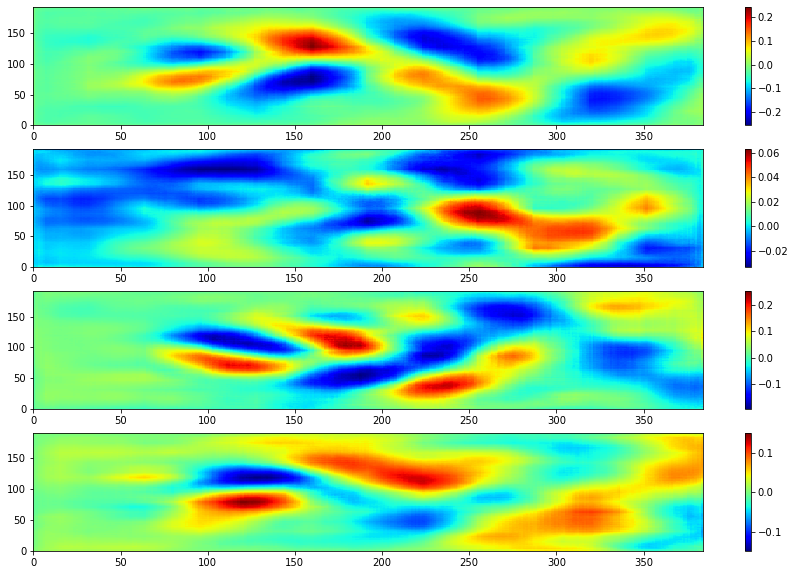

In [11]:

# Plot the first training snapshot of U vector
plt.figure(1, figsize=(15, 10))
plt.subplot(411)
plt.pcolormesh(x1d_4_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(412)
plt.pcolormesh(x2d_4_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(413)
plt.pcolormesh(x3d_4_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(414)
plt.pcolormesh(x4d_4_tmp[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

In [16]:
tmp = Model(autoencoder1.input, autoencoder1.get_layer('add_1').output)
r34 = tmp.predict(X_train)
print(r34.shape)

(1400, 384, 192, 2)


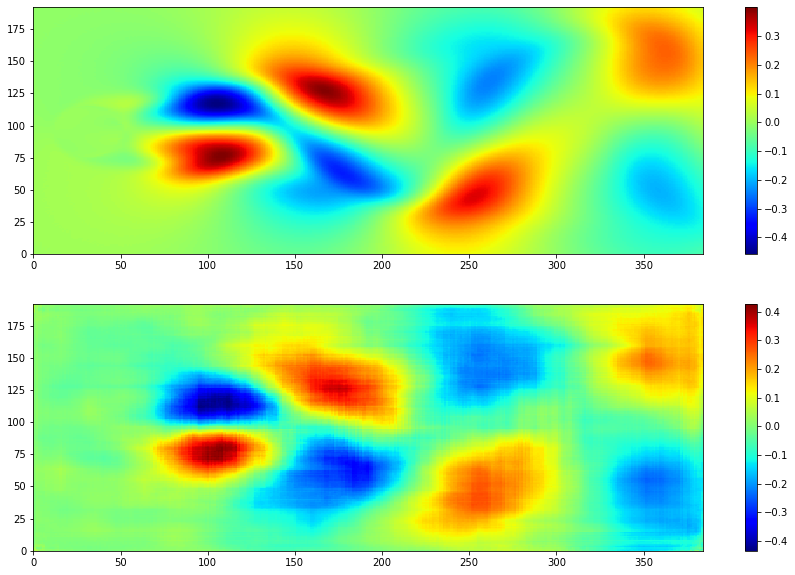

In [17]:
# Plot the first training snapshot of U vector
plt.figure(1, figsize=(15, 10))
plt.subplot(211)
plt.pcolormesh(X_train[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()

# Plot the first training snapshot of U vector
plt.subplot(212)
plt.pcolormesh(r34[0][:,:,0].T, cmap = cm.jet)
plt.colorbar()
